# Colorisation

In [1]:
import torchvision
import torch
from torch.utils.data import DataLoader

from skimage.color import lab2rgb

import os
import random
import matplotlib.pyplot as plt

from modules.ImageDataset import ImageDataset
import modules.filemanagement as fm
import modules.utils as utils
from modules.colorDistribution import colorDistribution
from modules.losses import Losses
from modules.Trainer import Trainer
import modules.eval as eval

In [2]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

extentions = [".jpg", ".jpeg", ".png", ".JPEG"]

INPUT_DIR = "./input"
DATA_DIR = "./data"
MODEL_PATH = "./trained_models"
SAVE_DIR = "./output"

SAVE_EPOCHS = 10

TEST_TRAIN_SPLIT = 0.2
SHUFFLE = True

IMAGESIZE = (224, 224)
BATCH_SIZE = 32
NUM_WORKERS = 6

EPOCHS = 50
LEANRING_RATE = 0.0001

CLASSIFICATION_BUCKET_SIZE = 22

fm.makeFileStructure(DATA_DIR,INPUT_DIR,MODEL_PATH,SAVE_DIR)

In [3]:
# for root, dirs, files in os.walk(DATA_DIR):
#         for file in files:
#             os.rename(os.path.join(root, file), INPUT_DIR + "/" + file)

### Data Preperation

```Put all pictures in the folder named 'input'```

In [4]:
trainsize,testsize,unusable = fm.TrainTestSplit(INPUT_DIR, extentions, DATA_DIR, TEST_TRAIN_SPLIT, shuffle=SHUFFLE,numWorkers=NUM_WORKERS)
print(f"Train size:\t{trainsize}\nTest size:\t{testsize}\nUnusable:\t{unusable}")

Found 4 files in ./input


100%|██████████| 4/4 [00:00<00:00, 11.43it/s]

Train size:	3497
Test size:	818
Unusable:	4


### Idea
Pretrained model and sample script from [github: richzhang / colorization](https://github.com/richzhang/colorization)


In [5]:
IMAGE = f'./data/train/{random.choice(os.listdir("./data/train"))}'
IMAGE

'./data/train/00000447_(4).jpg'

C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 369 pixels
  return func(*args, **kwargs)


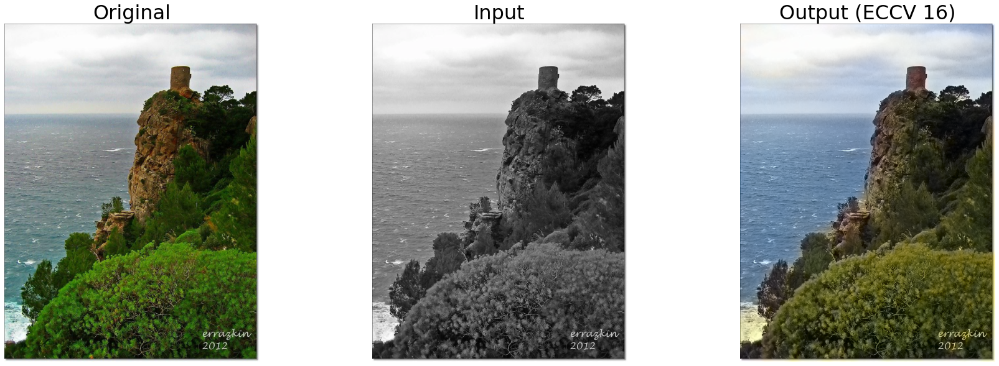

In [6]:
utils.plotPretrainedImage(IMAGE,DEVICE,IMAGESIZE)

### Colordistribution

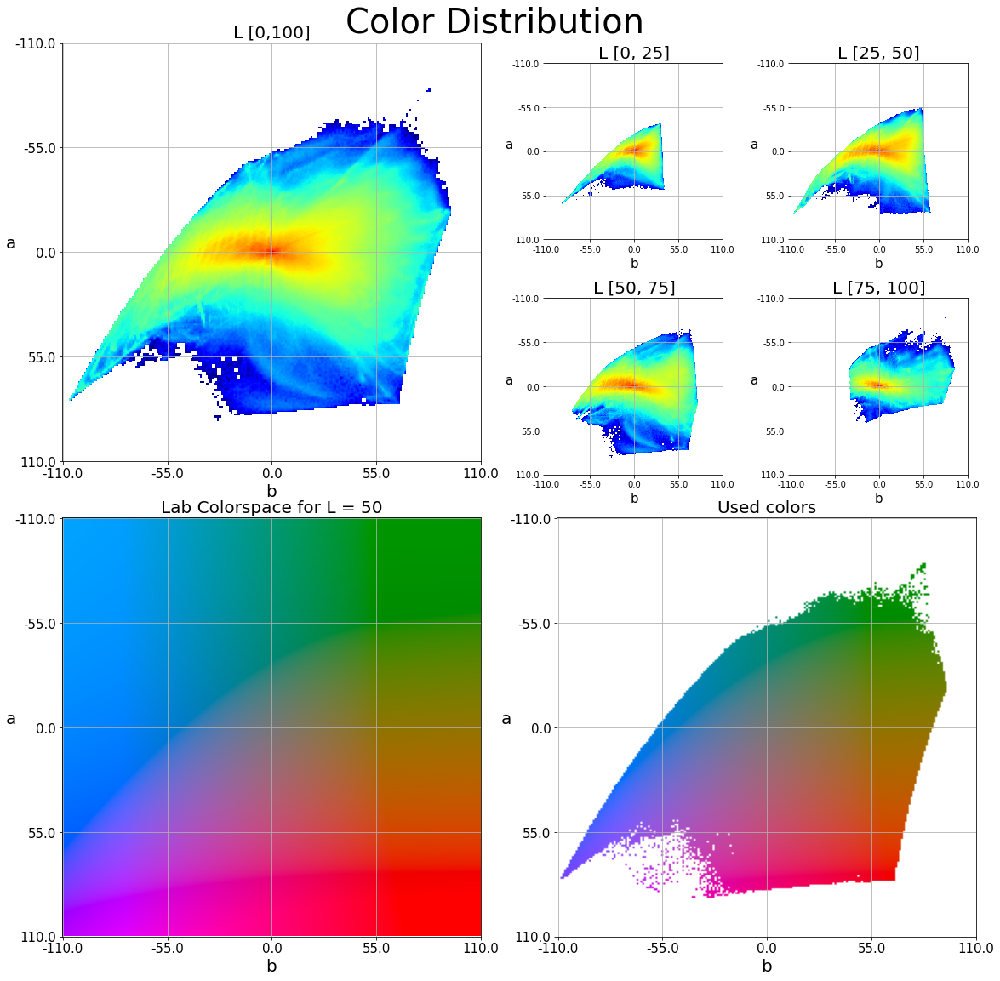

In [4]:
colorcount = colorDistribution(DATA_DIR,SAVE_DIR,220,NUM_WORKERS)
colorcount.read_lab_array()
colorcount.plot_colorDistribution()

### Dataloader

In [5]:
trainSet = ImageDataset(DATA_DIR + "/train", extentions, IMAGESIZE).cache()
testSet = ImageDataset(DATA_DIR + "/test", extentions, IMAGESIZE).cache()

# Build data loader
trainLoader = DataLoader(trainSet, batch_size = BATCH_SIZE, shuffle = True, num_workers = 0)
testLoader = DataLoader(testSet, batch_size = BATCH_SIZE, shuffle = True, num_workers = 0)

### Dataset Sample

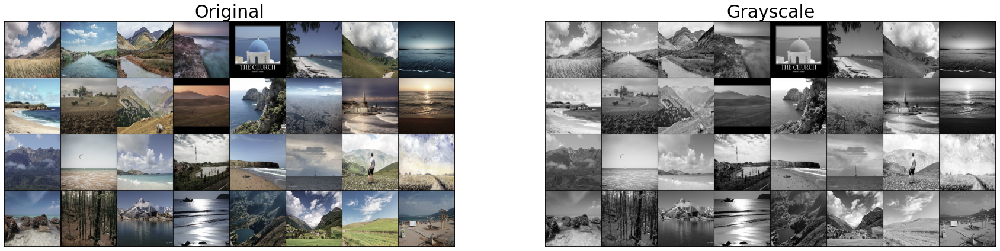

In [6]:
l_values, ab_values = next(iter(trainLoader))

Grayscalegrid = torchvision.utils.make_grid(l_values/100)
imageslab = torch.cat((l_values, ab_values), dim=1)
imagesrgb = lab2rgb(imageslab.cpu().numpy().transpose(0,2,3,1))
Colorgrid = torchvision.utils.make_grid(torch.Tensor(imagesrgb.transpose(0,3,1,2)))

plt.figure(figsize=(30,10))
plt.subplot(1,2,1)
plt.title('Original', fontsize=30)
plt.imshow(Colorgrid.permute(1,2,0))
plt.axis('off')
plt.subplot(1,2,2)
plt.title('Grayscale', fontsize=30)
plt.imshow(Grayscalegrid.permute(1,2,0))
plt.axis('off')
plt.show()

### Loss

Implemented losses: ['L1', 'L2', 'CE', 'wCE']
Weights for cross entropy:


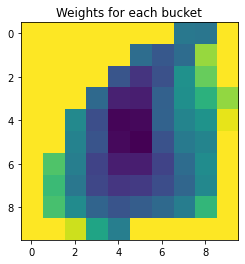

In [7]:
loss = Losses()
print(f"Implemented losses: {loss.getlosses()}")
weights = torch.tensor(colorcount.getClassWeights(CLASSIFICATION_BUCKET_SIZE),dtype=torch.float)
loss.setWeights(weights)
print("Weights for cross entropy:")
utils.plotWeights(weights,CLASSIFICATION_BUCKET_SIZE)

In [8]:
trainer = Trainer(CLASSIFICATION_BUCKET_SIZE,DEVICE,EPOCHS,LEANRING_RATE,DATA_DIR,SAVE_DIR,MODEL_PATH,NUM_WORKERS,SAVE_EPOCHS,trainLoader,testLoader)
trainer.initTrainsets()
print(trainer.getModelNames())
lossgraphs = {}

dict_keys(['eccv16_L1', 'alexnet_L1', 'eccv16_L2', 'alexnet_L2', 'eccv16_CE', 'alexnet_CE', 'eccv16_wCE', 'alexnet_wCE'])


Epoch: 1/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 5.1030	 Test L1-Loss: 4.9420	 Step Time: 2.04s	 Epoch Time: 224.83s
Epoch: 2/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.9553	 Test L1-Loss: 4.9398	 Step Time: 0.82s	 Epoch Time: 89.83s
Epoch: 3/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.9021	 Test L1-Loss: 4.8469	 Step Time: 0.82s	 Epoch Time: 89.87s
Epoch: 4/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.8344	 Test L1-Loss: 4.8158	 Step Time: 0.82s	 Epoch Time: 89.92s
Epoch: 5/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.8082	 Test L1-Loss: 4.7819	 Step Time: 0.82s	 Epoch Time: 89.92s
Epoch: 6/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.7846	 Test L1-Loss: 4.7431	 Step Time: 0.82s	 Epoch Time: 89.89s
Epoch: 7/50	[█████████████████████████████████████████████] Step: 110/110	 

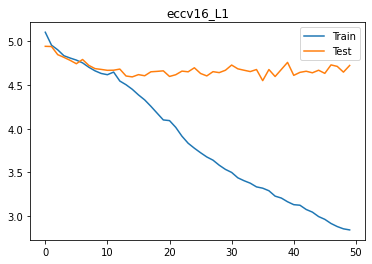

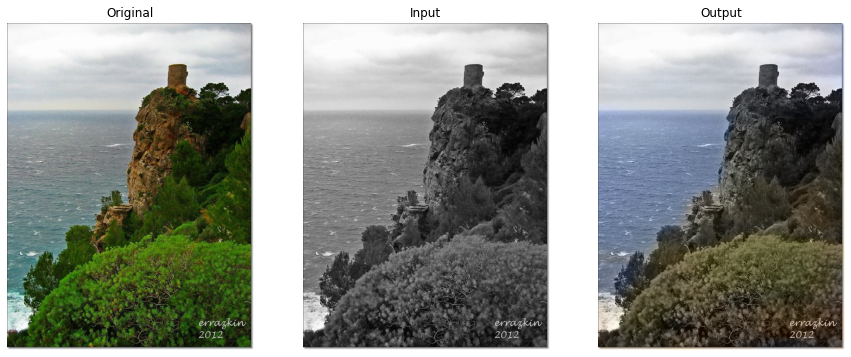

In [12]:
model = "eccv16_L1"
trainlossGraph, testlossGraph = trainer.trainModel(model)
lossgraphs[model] = {"train":trainlossGraph, "test":testlossGraph}
plt.title(model)
plt.plot(trainlossGraph, label="Train")
plt.plot(testlossGraph, label="Test")
plt.legend()
plt.show()
utils.plotImagefromModel(IMAGE,DEVICE,IMAGESIZE,trainer.getModel(model))
utils.saveTrainValLoss(trainlossGraph,testlossGraph,EPOCHS,model,outdir=SAVE_DIR)

Epoch: 1/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 60.2976	 Test L1-Loss: 5.0530	 Step Time: 0.81s	 Epoch Time: 89.37s
Epoch: 2/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 55.6331	 Test L1-Loss: 5.0545	 Step Time: 0.81s	 Epoch Time: 89.23s
Epoch: 3/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 54.3431	 Test L1-Loss: 5.1928	 Step Time: 0.81s	 Epoch Time: 89.20s
Epoch: 4/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 53.6351	 Test L1-Loss: 4.8925	 Step Time: 0.81s	 Epoch Time: 89.17s
Epoch: 5/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 52.5968	 Test L1-Loss: 4.8809	 Step Time: 0.81s	 Epoch Time: 89.17s
Epoch: 6/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 51.4983	 Test L1-Loss: 4.8313	 Step Time: 0.81s	 Epoch Time: 89.00s
Epoch: 7/50	[█████████████████████████████████████████████] Step: 110/

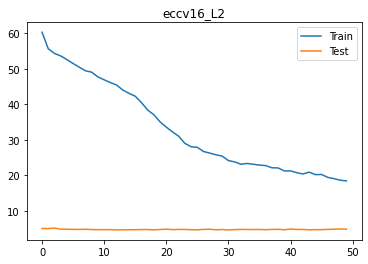

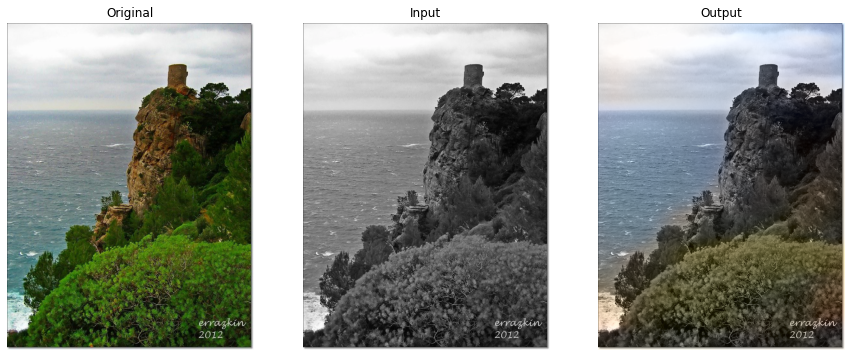

In [13]:
model = "eccv16_L2"
trainlossGraph, testlossGraph = trainer.trainModel(model)
lossgraphs[model] = {"train":trainlossGraph, "test":testlossGraph}
plt.title(model)
plt.plot(trainlossGraph, label="Train")
plt.plot(testlossGraph, label="Test")
plt.legend()
plt.show()
utils.plotImagefromModel(IMAGE,DEVICE,IMAGESIZE,trainer.getModel(model))
utils.saveTrainValLoss(trainlossGraph,testlossGraph,EPOCHS,model,outdir=SAVE_DIR)

Epoch: 1/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6014	 Test L1-Loss: 150.8171	 Step Time: 0.88s	 Epoch Time: 96.61s
Epoch: 2/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.5940	 Test L1-Loss: 145.0904	 Step Time: 0.88s	 Epoch Time: 96.79s
Epoch: 3/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.5929	 Test L1-Loss: 146.3304	 Step Time: 0.88s	 Epoch Time: 96.66s
Epoch: 4/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.5924	 Test L1-Loss: 145.8980	 Step Time: 0.88s	 Epoch Time: 96.52s
Epoch: 5/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.5922	 Test L1-Loss: 150.6111	 Step Time: 0.88s	 Epoch Time: 96.55s
Epoch: 6/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.5922	 Test L1-Loss: 150.0508	 Step Time: 0.88s	 Epoch Time: 96.46s
Epoch: 7/50	[█████████████████████████████████████████████] Step

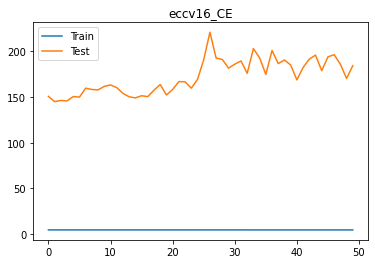

C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 548284 pixels
  return func(*args, **kwargs)


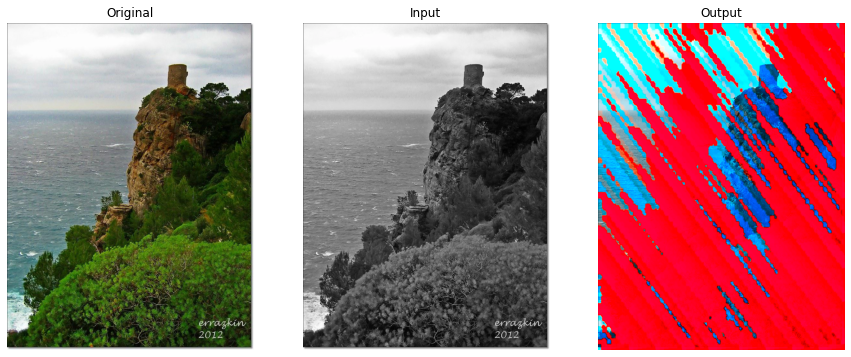

In [14]:
model = "eccv16_CE"
trainlossGraph, testlossGraph = trainer.trainModel(model)
lossgraphs[model] = {"train":trainlossGraph, "test":testlossGraph}
plt.title(model)
plt.plot(trainlossGraph, label="Train")
plt.plot(testlossGraph, label="Test")
plt.legend()
plt.show()
utils.plotImagefromModel(IMAGE,DEVICE,IMAGESIZE,trainer.getModel(model),classes = True,bucket_size = CLASSIFICATION_BUCKET_SIZE)
utils.saveTrainValLoss(trainlossGraph,testlossGraph,EPOCHS,model,outdir=SAVE_DIR)

Epoch: 1/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6014	 Test L1-Loss: 209.7015	 Step Time: 0.88s	 Epoch Time: 96.80s
Epoch: 2/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.5936	 Test L1-Loss: 216.4181	 Step Time: 0.89s	 Epoch Time: 97.88s
Epoch: 3/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.5915	 Test L1-Loss: 216.0853	 Step Time: 0.88s	 Epoch Time: 97.15s
Epoch: 4/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.5912	 Test L1-Loss: 216.6275	 Step Time: 0.89s	 Epoch Time: 97.75s
Epoch: 5/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.5914	 Test L1-Loss: 215.9357	 Step Time: 0.89s	 Epoch Time: 97.56s
Epoch: 6/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.5912	 Test L1-Loss: 210.7415	 Step Time: 0.89s	 Epoch Time: 97.70s
Epoch: 7/50	[█████████████████████████████████████████████] Step

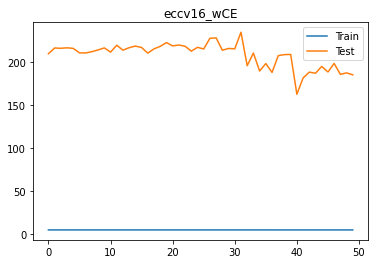

C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 717592 pixels
  return func(*args, **kwargs)


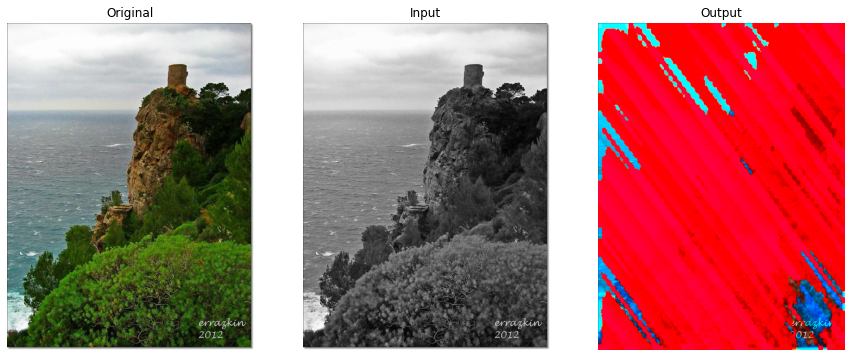

In [15]:
model = "eccv16_wCE"
trainlossGraph, testlossGraph = trainer.trainModel(model)
lossgraphs[model] = {"train":trainlossGraph, "test":testlossGraph}
plt.title(model)
plt.plot(trainlossGraph, label="Train")
plt.plot(testlossGraph, label="Test")
plt.legend()
plt.show()
utils.plotImagefromModel(IMAGE,DEVICE,IMAGESIZE,trainer.getModel(model),classes = True,bucket_size = CLASSIFICATION_BUCKET_SIZE)
utils.saveTrainValLoss(trainlossGraph,testlossGraph,EPOCHS,model,outdir=SAVE_DIR)

Epoch: 1/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 5.2415	 Test L1-Loss: 5.1704	 Step Time: 0.50s	 Epoch Time: 54.88s
Epoch: 2/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 5.1529	 Test L1-Loss: 5.1247	 Step Time: 0.50s	 Epoch Time: 54.77s
Epoch: 3/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 5.0971	 Test L1-Loss: 5.0753	 Step Time: 0.50s	 Epoch Time: 54.67s
Epoch: 4/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 5.0295	 Test L1-Loss: 4.9834	 Step Time: 0.50s	 Epoch Time: 54.67s
Epoch: 5/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.9725	 Test L1-Loss: 4.9554	 Step Time: 0.50s	 Epoch Time: 54.70s
Epoch: 6/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.9280	 Test L1-Loss: 4.9275	 Step Time: 0.50s	 Epoch Time: 54.71s
Epoch: 7/50	[█████████████████████████████████████████████] Step: 110/110	 T

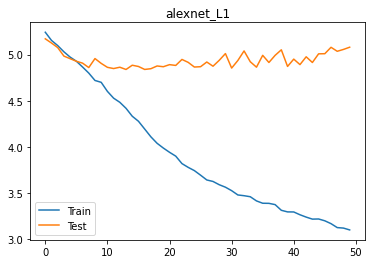

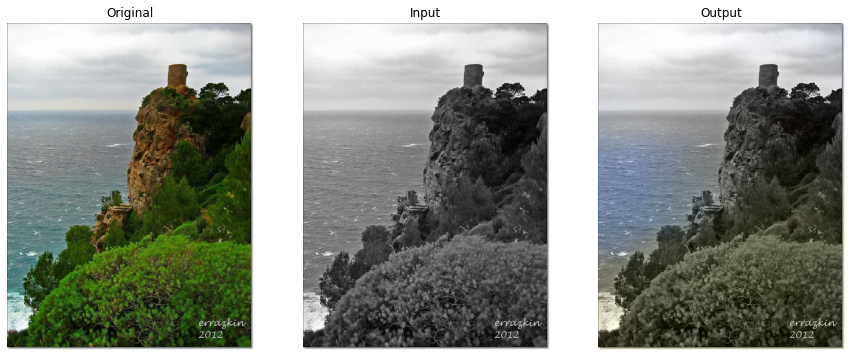

In [16]:
model = "alexnet_L1"
trainlossGraph, testlossGraph = trainer.trainModel(model)
lossgraphs[model] = {"train":trainlossGraph, "test":testlossGraph}
plt.title(model)
plt.plot(trainlossGraph, label="Train")
plt.plot(testlossGraph, label="Test")
plt.legend()
plt.show()
utils.plotImagefromModel(IMAGE,DEVICE,IMAGESIZE,trainer.getModel(model))
utils.saveTrainValLoss(trainlossGraph,testlossGraph,EPOCHS,model,outdir=SAVE_DIR)

Epoch: 1/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 62.5831	 Test L1-Loss: 5.1925	 Step Time: 0.40s	 Epoch Time: 43.71s
Epoch: 2/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 59.1918	 Test L1-Loss: 5.1860	 Step Time: 0.40s	 Epoch Time: 43.82s
Epoch: 3/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 57.6388	 Test L1-Loss: 5.0913	 Step Time: 0.40s	 Epoch Time: 43.82s
Epoch: 4/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 55.9774	 Test L1-Loss: 5.0536	 Step Time: 0.40s	 Epoch Time: 43.76s
Epoch: 5/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 54.1536	 Test L1-Loss: 5.0770	 Step Time: 0.40s	 Epoch Time: 43.64s
Epoch: 6/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 52.5929	 Test L1-Loss: 4.9719	 Step Time: 0.40s	 Epoch Time: 43.62s
Epoch: 7/50	[█████████████████████████████████████████████] Step: 110/

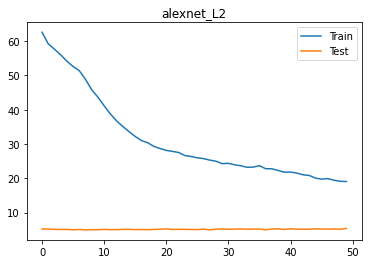

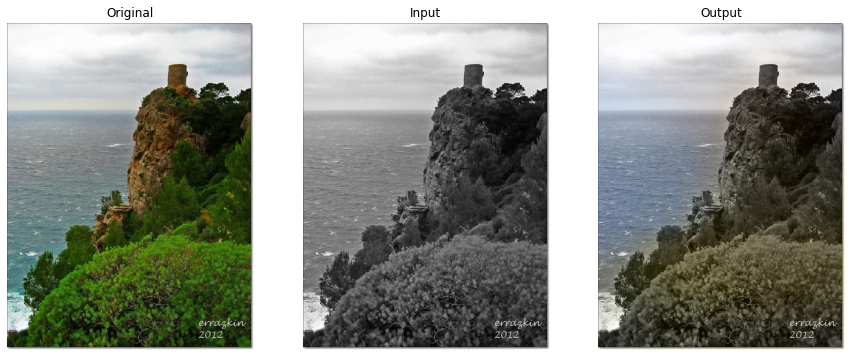

In [17]:
model = "alexnet_L2"
trainlossGraph, testlossGraph = trainer.trainModel(model)
lossgraphs[model] = {"train":trainlossGraph, "test":testlossGraph}
plt.title(model)
plt.plot(trainlossGraph, label="Train")
plt.plot(testlossGraph, label="Test")
plt.legend()
plt.show()
utils.plotImagefromModel(IMAGE,DEVICE,IMAGESIZE,trainer.getModel(model))
utils.saveTrainValLoss(trainlossGraph,testlossGraph,EPOCHS,model,outdir=SAVE_DIR)

Epoch: 1/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6050	 Test L1-Loss: 231.0825	 Step Time: 0.25s	 Epoch Time: 28.01s
Epoch: 2/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6048	 Test L1-Loss: 182.1643	 Step Time: 0.25s	 Epoch Time: 27.87s
Epoch: 3/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6048	 Test L1-Loss: 271.5012	 Step Time: 0.25s	 Epoch Time: 27.88s
Epoch: 4/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6048	 Test L1-Loss: 177.8196	 Step Time: 0.25s	 Epoch Time: 27.76s
Epoch: 5/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6048	 Test L1-Loss: 153.2058	 Step Time: 0.25s	 Epoch Time: 27.78s
Epoch: 6/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6048	 Test L1-Loss: 146.3199	 Step Time: 0.25s	 Epoch Time: 27.77s
Epoch: 7/50	[█████████████████████████████████████████████] Step

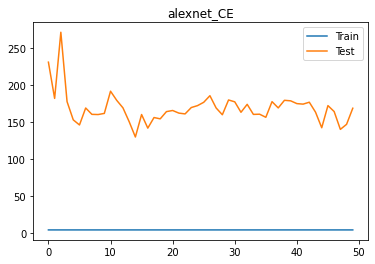

C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 716868 pixels
  return func(*args, **kwargs)


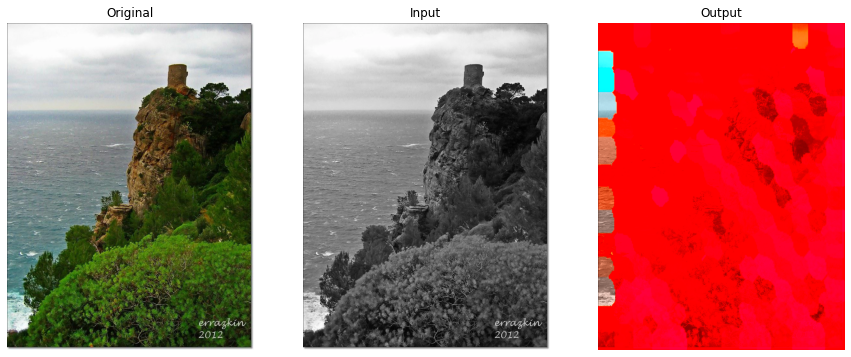

In [18]:
model = "alexnet_CE"
trainlossGraph, testlossGraph = trainer.trainModel(model)
lossgraphs[model] = {"train":trainlossGraph, "test":testlossGraph}
plt.title(model)
plt.plot(trainlossGraph, label="Train")
plt.plot(testlossGraph, label="Test")
plt.legend()
plt.show()
utils.plotImagefromModel(IMAGE,DEVICE,IMAGESIZE,trainer.getModel(model),classes = True,bucket_size = CLASSIFICATION_BUCKET_SIZE)
utils.saveTrainValLoss(trainlossGraph,testlossGraph,EPOCHS,model,outdir=SAVE_DIR)

Epoch: 1/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6050	 Test L1-Loss: 191.0064	 Step Time: 0.26s	 Epoch Time: 28.78s
Epoch: 2/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6048	 Test L1-Loss: 163.6440	 Step Time: 0.26s	 Epoch Time: 28.75s
Epoch: 3/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6048	 Test L1-Loss: 187.9054	 Step Time: 0.26s	 Epoch Time: 28.73s
Epoch: 4/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6048	 Test L1-Loss: 174.6734	 Step Time: 0.26s	 Epoch Time: 28.73s
Epoch: 5/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6048	 Test L1-Loss: 127.6625	 Step Time: 0.26s	 Epoch Time: 28.64s
Epoch: 6/50	[█████████████████████████████████████████████] Step: 110/110	 Train Loss: 4.6048	 Test L1-Loss: 195.0236	 Step Time: 0.26s	 Epoch Time: 28.67s
Epoch: 7/50	[█████████████████████████████████████████████] Step

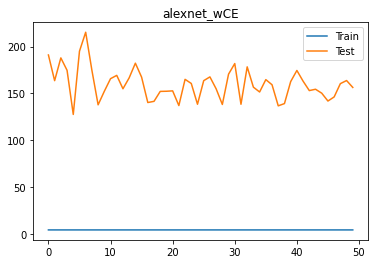

C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 356464 pixels
  return func(*args, **kwargs)


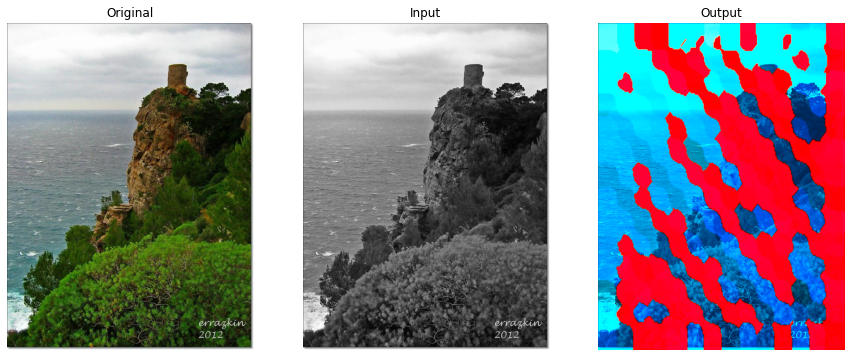

In [19]:
model = "alexnet_wCE"
trainlossGraph, testlossGraph = trainer.trainModel(model)
lossgraphs[model] = {"train":trainlossGraph, "test":testlossGraph}
plt.title(model)
plt.plot(trainlossGraph, label="Train")
plt.plot(testlossGraph, label="Test")
plt.legend()
plt.show()
utils.plotImagefromModel(IMAGE,DEVICE,IMAGESIZE,trainer.getModel(model),classes = True,bucket_size = CLASSIFICATION_BUCKET_SIZE)
utils.saveTrainValLoss(trainlossGraph,testlossGraph,EPOCHS,model,outdir=SAVE_DIR)

### Evaluation

In [9]:
models,losses = eval.getTrainedData(MODEL_PATH,SAVE_DIR)

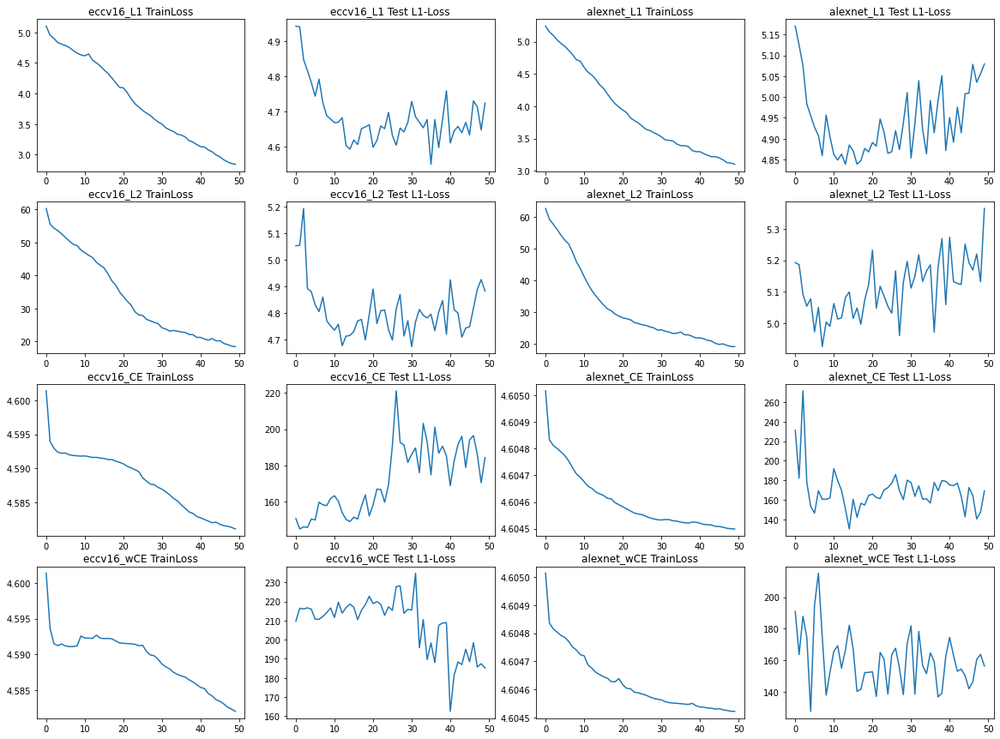

In [10]:
eval.plotLoss(losses,SAVE_DIR)

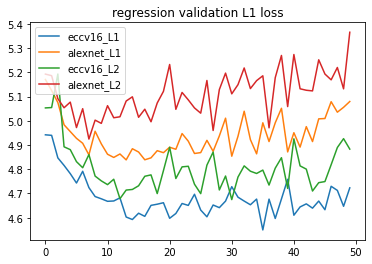

In [11]:
eval.plotRegressionValLoss(SAVE_DIR,losses)

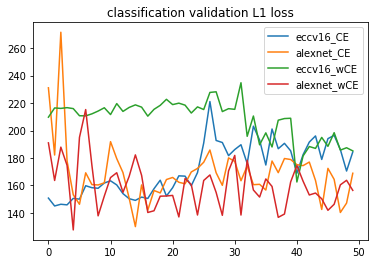

In [12]:
eval.plotClassificationValLoss(SAVE_DIR,losses)

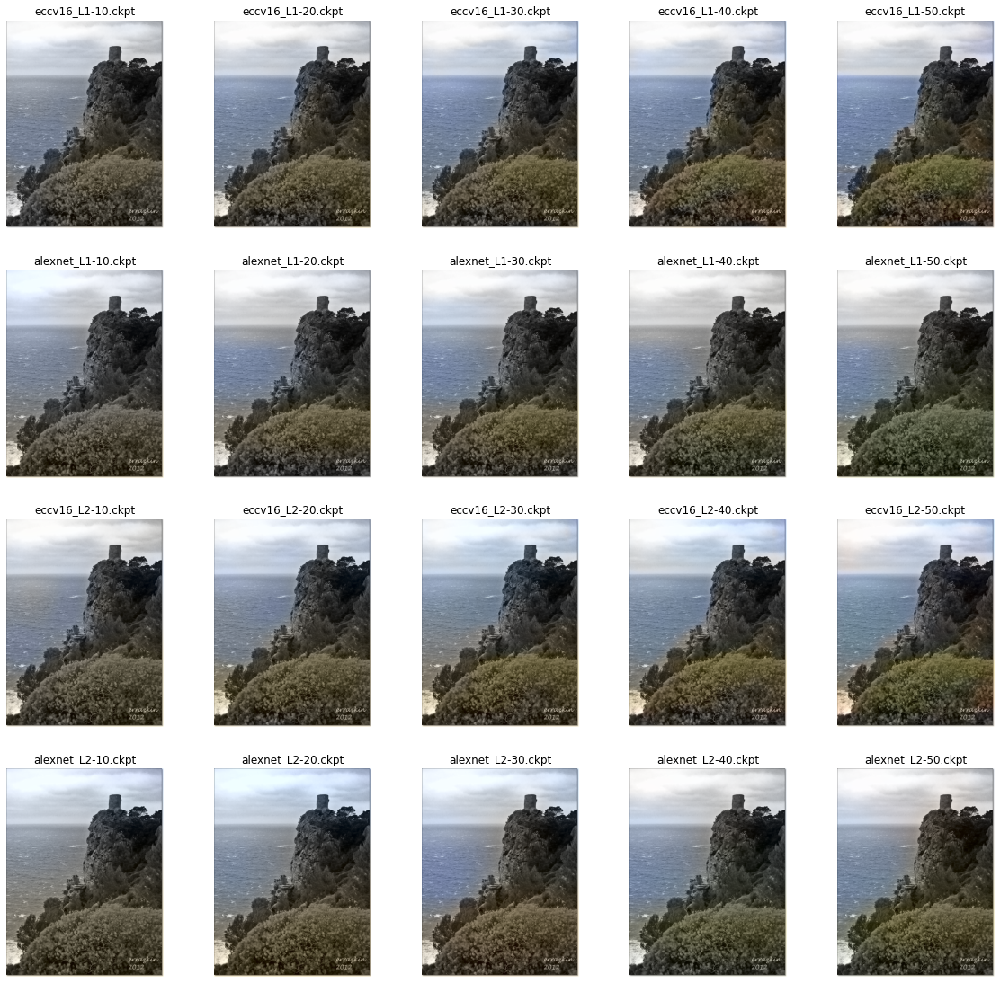

C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 338947 pixels
  return func(*args, **kwargs)
C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 317878 pixels
  return func(*args, **kwargs)
C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 532020 pixels
  return func(*args, **kwargs)
C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 483530 pixels
  return func(*args, **kwargs)
C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 548284 pixels
  return func(*args, **kwargs)
C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\ut

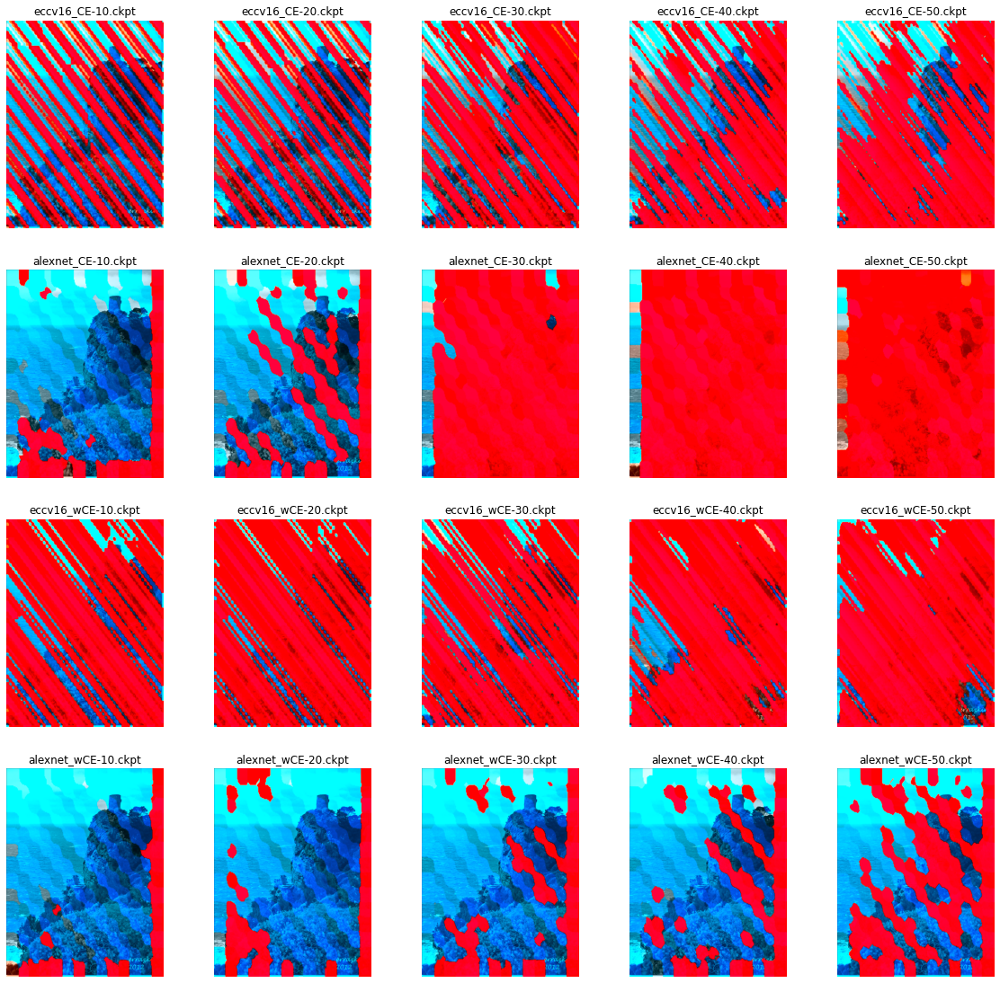

In [13]:
eval.plotModelCheckpoints(IMAGE,IMAGESIZE,DEVICE,trainer,models,MODEL_PATH,CLASSIFICATION_BUCKET_SIZE)

C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 969603 pixels
  return func(*args, **kwargs)
C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 585818 pixels
  return func(*args, **kwargs)
C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 964868 pixels
  return func(*args, **kwargs)
C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 1003540 pixels
  return func(*args, **kwargs)
C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\utils.py:394: UserWarning: Color data out of range: Z < 0 in 247774 pixels
  return func(*args, **kwargs)
C:\Users\andyz\AppData\Roaming\Python\Python310\site-packages\skimage\_shared\u

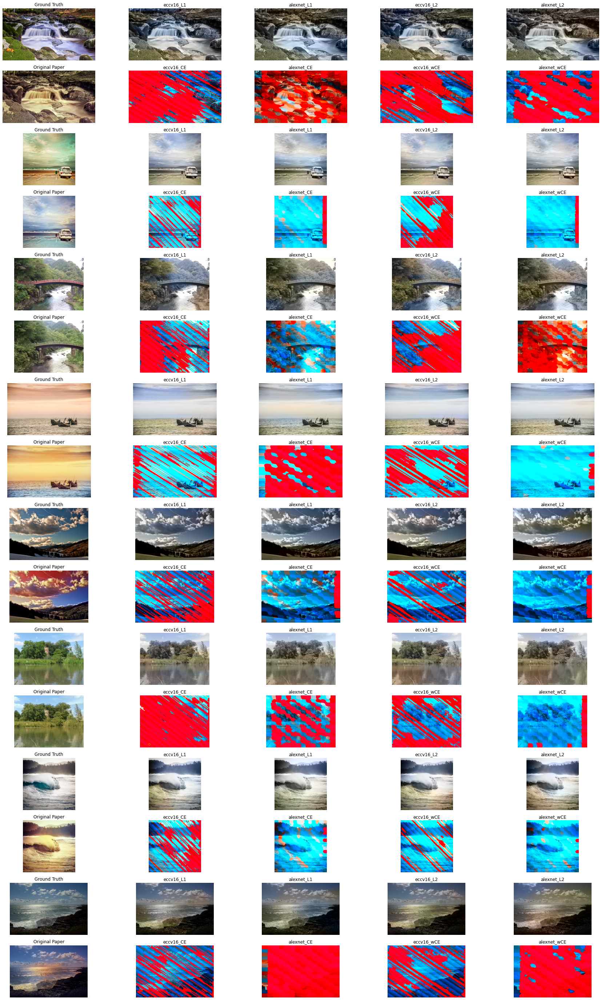

In [10]:
pictures = 8
eval.plotDifferentPicturesPerModel(pictures,IMAGESIZE,DEVICE,trainer,models,MODEL_PATH,CLASSIFICATION_BUCKET_SIZE)